In [61]:
import pandas as pd
import numpy as np
import scipy as sc
import matplotlib.pyplot as plt
%matplotlib inline
import datetime

import seaborn as sns

from pylab import rcParams
rcParams['figure.figsize'] = 12,12

from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold

from sklearn.metrics import roc_auc_score, roc_curve, make_scorer
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import classification_report
from sklearn.metrics import average_precision_score

import statsmodels.api as sm
import statsmodels.formula.api as smf

# to make this notebook's output stable across runs
np.random.seed(42)

from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.feature_selection import RFE

from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

In [12]:
df = pd.read_csv('data/data_breast.csv')
df[df['diagnosis'] == 'B'].iloc[0:5, 0:12].head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean
19,8510426,B,13.540,14.36,87.46,566.3,0.09779,0.08129,0.06664,0.047810,0.1885,0.05766
20,8510653,B,13.080,15.71,85.63,520.0,0.10750,0.12700,0.04568,0.031100,0.1967,0.06811
21,8510824,B,9.504,12.44,60.34,273.9,0.10240,0.06492,0.02956,0.020760,0.1815,0.06905
37,854941,B,13.030,18.42,82.61,523.8,0.08983,0.03766,0.02562,0.029230,0.1467,0.05863
46,85713702,B,8.196,16.84,51.71,201.9,0.08600,0.05943,0.01588,0.005917,0.1769,0.06503


In [13]:
df[df['diagnosis'] == 'M'].iloc[0:5, 0:12].head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883


Задача заключается в предсказании переменной “Diagnosis” - является ли содержимое биоптата доброкачественным (значение “B” – benign) либо злокачественным (значение “M” –malicious). 

In [14]:
# Уберем лишную переменную
df.drop(labels='Unnamed: 32', axis=1, inplace=True)
# Преобразуем target
#df['target'] = df['diagnosis'].apply(lambda x : 1 if x =='M' else 0 if x == 'B' else NaN)
df['target'] = df['diagnosis'].map({'M' : 1, 'B' : 0})
df.drop(labels='diagnosis', axis=1, inplace=True)
df.columns = ['id', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave_points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'target']

df.head()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst,target
0,842302,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,1
1,842517,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,1
2,84300903,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,1
3,84348301,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,1
4,84358402,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,1


In [5]:
print(df.columns)

Index(['id', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave_points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'target'],
      dtype='object')


In [15]:
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst,target
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.372583
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,0.000000
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


In [16]:
# классы более менее сбалансированы
df.target.value_counts()

0    357
1    212
Name: target, dtype: int64

In [17]:
# пропущенные значения отсутствуют
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
id                         569 non-null int64
radius_mean                569 non-null float64
texture_mean               569 non-null float64
perimeter_mean             569 non-null float64
area_mean                  569 non-null float64
smoothness_mean            569 non-null float64
compactness_mean           569 non-null float64
concavity_mean             569 non-null float64
concave_points_mean        569 non-null float64
symmetry_mean              569 non-null float64
fractal_dimension_mean     569 non-null float64
radius_se                  569 non-null float64
texture_se                 569 non-null float64
perimeter_se               569 non-null float64
area_se                    569 non-null float64
smoothness_se              569 non-null float64
compactness_se             569 non-null float64
concavity_se               569 non-null float64
concave_points_se          569 no

Детальное описание, взятое с сайта. 
Ten real-valued features are computed for each cell nucleus:

a) radius (mean of distances from center to points on the perimeter)
b) texture (standard deviation of gray-scale values)
c) perimeter
d) area
e) smoothness (local variation in radius lengths)
f) compactness (perimeter^2 / area - 1.0)
g) concavity (severity of concave portions of the contour)
h) concave points (number of concave portions of the contour)
i) symmetry
j) fractal dimension ("coastline approximation" - 1)

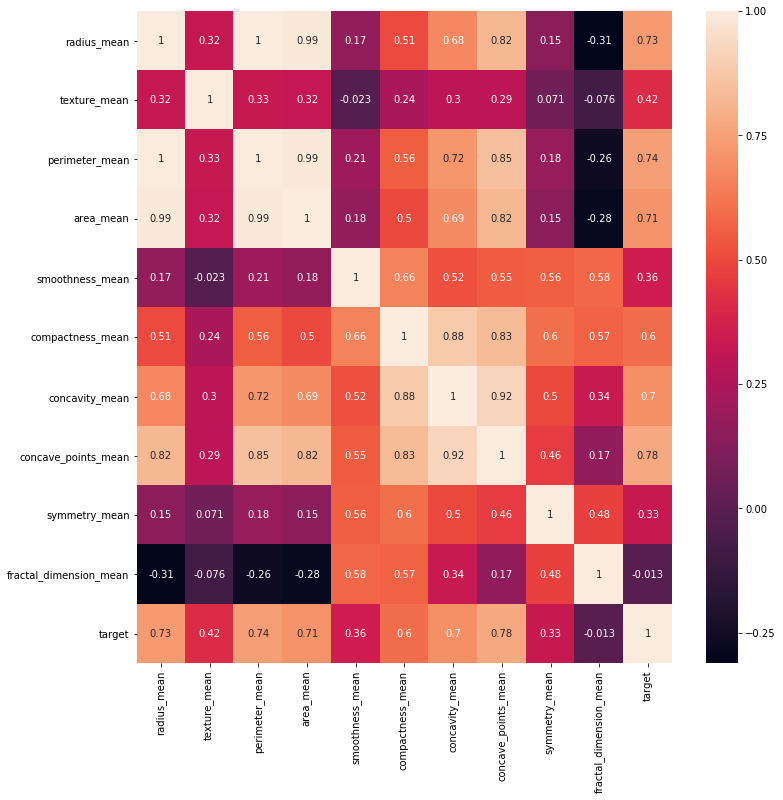

In [18]:
# рассчитать корреляцию между переменными
df_mean = df[['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean','smoothness_mean', 'compactness_mean', 'concavity_mean','concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'target']]
sns.heatmap(df_mean.corr(), annot=True)

In [143]:
#sns.heatmap(df.corr(), annot=True)

C:\Users\mi\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\mi\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


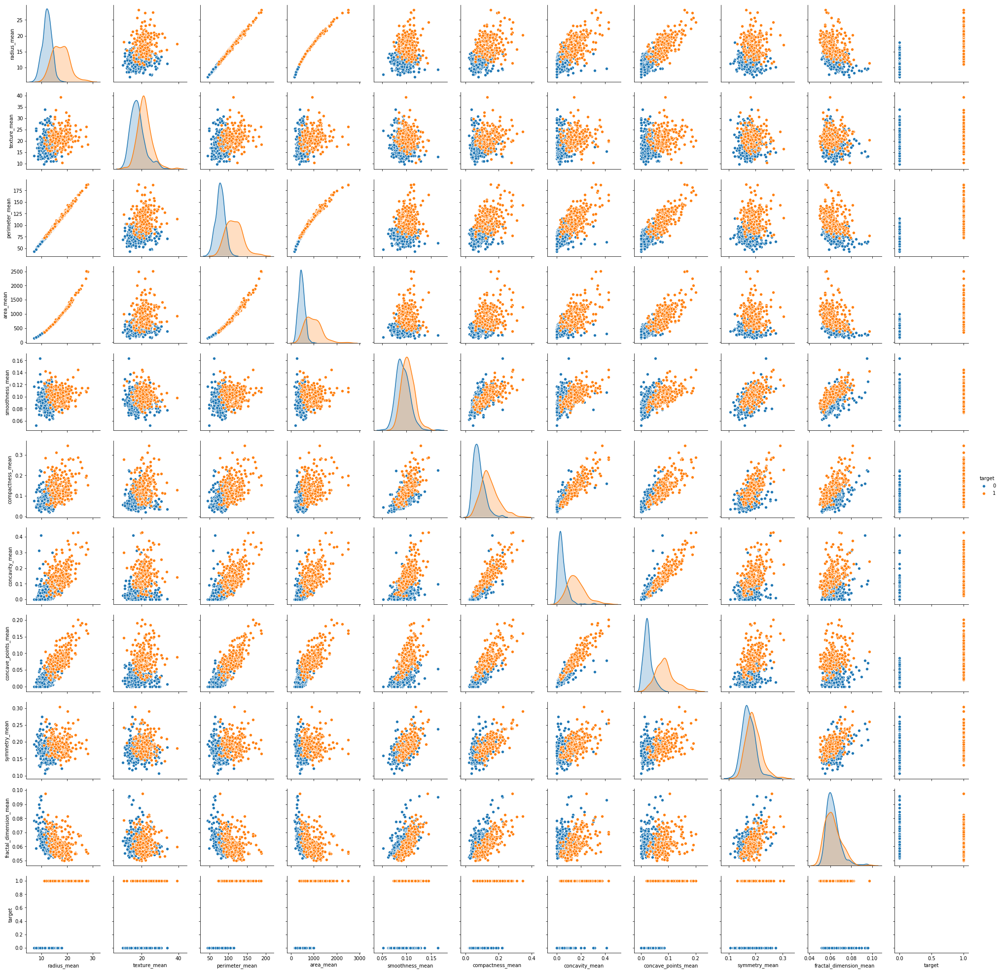

In [8]:
# графики, построенные только по средним значениям параметров, уже оказываются довольно информативными, 
# так как явно можно выделить 2 класса линией
sns.pairplot(df_mean, hue='target');

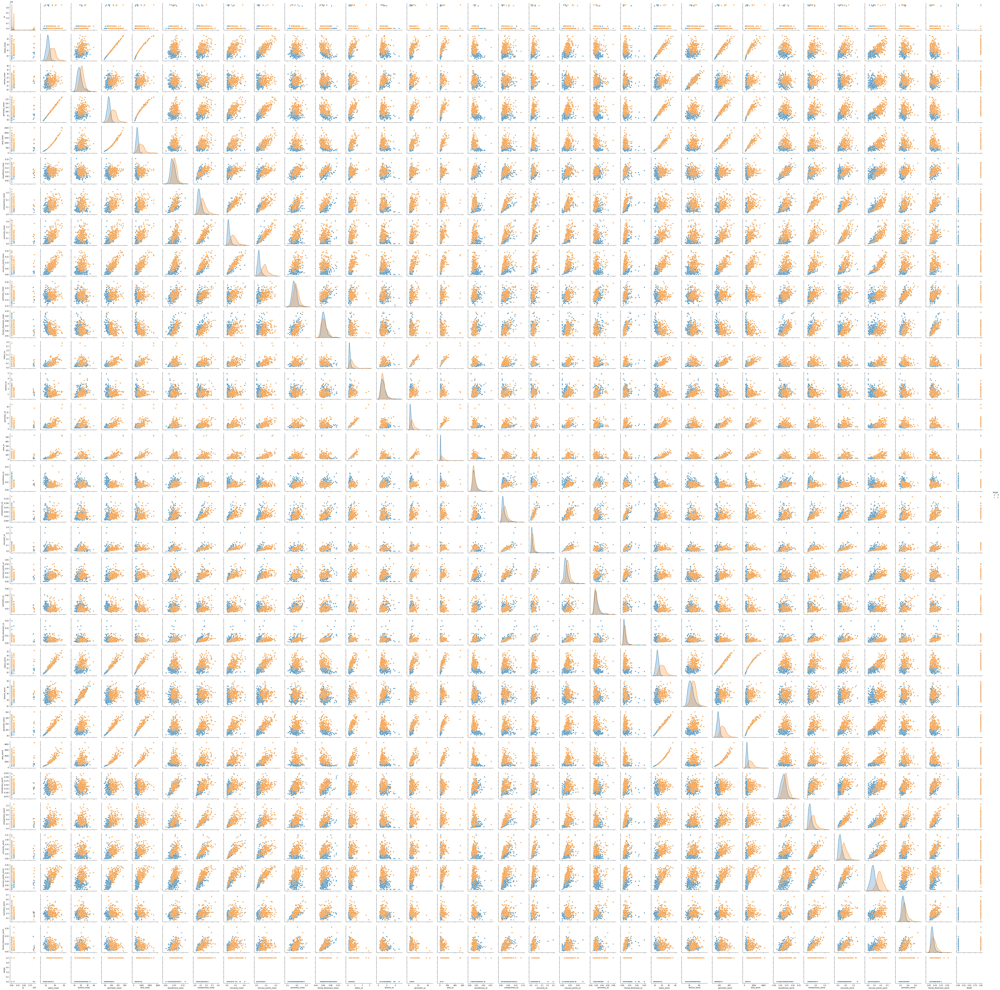

In [9]:
sns.pairplot(df, hue='target');

In [144]:
# Функция для расчета accuracy, precision, recall, f1_score 
def get_metrics(model, y_train, y_train_predict, y_test, y_test_predict):
    print('Accuracy of the classifier on train set: {:.5f}'.format(accuracy_score(y_train, y_train_predict)))
    print('Accuracy of the classifier on test set: {:.5f}'.format(accuracy_score(y_test, y_test_predict)))
    print('Precision of the classifier on train set: {:.5f}'.format(precision_score(y_train, y_train_predict)))
    print('Precision of the classifier on test set: {:.5f}'.format(precision_score(y_test, y_test_predict)))
    print('Recall of the classifier on train set: {:.5f}'.format(recall_score(y_train, y_train_predict)))
    print('Recall of the classifier on test set: {:.5f}'.format(recall_score(y_test, y_test_predict)))
    print('F1_score of the classifier on train set: {:.5f}'.format(f1_score(y_train, y_train_predict)))
    print('F1_score of the classifier on test set: {:.5f}'.format(f1_score(y_test, y_test_predict)))
    

Подход backward feature selection - посмотрим, какие фичи можно убрать без влияния на таргет

In [150]:
cols = df.columns.drop(labels=['id', 'target'])
print(len(cols), cols)

30 Index(['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave_points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')


In [151]:
# воспользуемся корреляцией между переменными и обрежем фичи, при которых корреляция меньше 0.5
all_corr_col = []

# df 
for col in cols:
    if abs(sc.stats.pointbiserialr(df['target'], df[col])[0]) >=0.5:
        all_corr_col.append(col)
        
print(len(all_corr_col), all_corr_col, type(all_corr_col))

15 ['radius_mean', 'perimeter_mean', 'area_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'radius_se', 'perimeter_se', 'area_se', 'radius_worst', 'perimeter_worst', 'area_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst'] <class 'list'>


Cравним 2 алгоритмы - случайный лес и логистическая регрессия

#### Prepare train and test splits

In [152]:
y = df[['target']]
X = df[all_corr_col]#.drop(labels=['target','id'], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

In [160]:
# random forest
clf = RandomForestClassifier(n_estimators=150, max_depth=10, random_state=0)
clf.fit(X_train, y_train)
y_train_predict = clf.predict(X_train)
y_test_predict = clf.predict(X_test)
get_metrics(model=logit, y_train=y_train, y_train_predict=y_train_predict, 
            y_test=y_test, y_test_predict=y_test_predict)

print('Get predict_proba : ')
print(clf.predict_proba(X_test))

C:\Users\mi\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  This is separate from the ipykernel package so we can avoid doing imports until


Accuracy of the classifier on train set: 1.00000
Accuracy of the classifier on test set: 0.94386
Precision of the classifier on train set: 1.00000
Precision of the classifier on test set: 0.92708
Recall of the classifier on train set: 1.00000
Recall of the classifier on test set: 0.90816
F1_score of the classifier on train set: 1.00000
F1_score of the classifier on test set: 0.91753
Get predict_proba : 
[[0.89333333 0.10666667]
 [0.         1.        ]
 [0.00666667 0.99333333]
 [0.98666667 0.01333333]
 [1.         0.        ]
 [0.         1.        ]
 [0.         1.        ]
 [0.         1.        ]
 [0.24       0.76      ]
 [0.98666667 0.01333333]
 [1.         0.        ]
 [0.         1.        ]
 [0.83333333 0.16666667]
 [0.12666667 0.87333333]
 [0.98666667 0.01333333]
 [0.         1.        ]
 [0.9        0.1       ]
 [1.         0.        ]
 [1.         0.        ]
 [0.         1.        ]
 [0.54666667 0.45333333]
 [0.99333333 0.00666667]
 [0.         1.        ]
 [1.         0.   

In [161]:
# логистическая регрессия
logit = LogisticRegression()
logit.fit(X_train, y_train)

y_train_predict = logit.predict(X_train)
y_test_predic = logit.predict(X_test)

get_metrics(model=logit, y_train=y_train, y_train_predict=y_train_predict, 
            y_test=y_test, y_test_predict=y_test_predict)

print('Get predict_proba : ')
print(logit.predict_proba(X_test))

Accuracy of the classifier on train set: 0.95070
Accuracy of the classifier on test set: 0.94386
Precision of the classifier on train set: 0.97170
Precision of the classifier on test set: 0.92708
Recall of the classifier on train set: 0.90351
Recall of the classifier on test set: 0.90816
F1_score of the classifier on train set: 0.93636
F1_score of the classifier on test set: 0.91753
Get predict_proba : 
[[5.71905183e-01 4.28094817e-01]
 [1.28573663e-09 9.99999999e-01]
 [9.63977733e-04 9.99036022e-01]
 [9.87400504e-01 1.25994963e-02]
 [9.84050895e-01 1.59491049e-02]
 [3.89378618e-09 9.99999996e-01]
 [9.69668790e-13 1.00000000e+00]
 [4.48388854e-03 9.95516111e-01]
 [9.89183767e-01 1.08162329e-02]
 [9.62144756e-01 3.78552441e-02]
 [9.83818453e-01 1.61815467e-02]
 [2.92516499e-04 9.99707484e-01]
 [9.87638012e-01 1.23619876e-02]
 [6.07211171e-02 9.39278883e-01]
 [9.88097606e-01 1.19023938e-02]
 [1.05338894e-02 9.89466111e-01]
 [9.81003785e-01 1.89962150e-02]
 [9.95512310e-01 4.48769045e-03]

C:\Users\mi\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\mi\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Подход forward selection c использованием случайного леса

#### Prepare train and test splits

In [117]:
y = df[['target']]
X = df.drop(labels=['target','id'], axis=1)

In [118]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

In [121]:
clf = RandomForestClassifier(n_estimators=100, max_depth=30, random_state=42)
clf.fit(X_train, y_train)

C:\Users\mi\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=30, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=42, verbose=0, warm_start=False)

In [123]:
# используем прогон до 30 переменных и посмотрим на изменение качества
skf = StratifiedKFold(n_splits=4)

sfs_forward = SFS(clf, 
           k_features=30, 
           forward=True, 
           floating=True, 
           verbose=1,
           scoring='accuracy',
           cv=skf,
           n_jobs=-1)

sfs_forward = sfs_forward.fit(X_train.values, y_train.values,custom_feature_names=X_train.columns)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    9.7s finished
Features: 1/30[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  29 out of  29 | elapsed:    3.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.5s finished
Features: 2/30[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  28 out of  28 | elapsed:    3.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    0.5s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    0.5s finished
Features: 3/30[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  27 out of  27 | elapsed:    3.3s fini

[Parallel(n_jobs=-1)]: Done  18 out of  18 | elapsed:    2.6s finished
Features: 19/30[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   8 out of  11 | elapsed:    1.3s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done  11 out of  11 | elapsed:    1.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  19 out of  19 | elapsed:    2.7s finished
Features: 20/30[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    1.1s remaining:    0.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    1.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:    2.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  19 out of  19 | elapsed:    2.6s finished
Fe

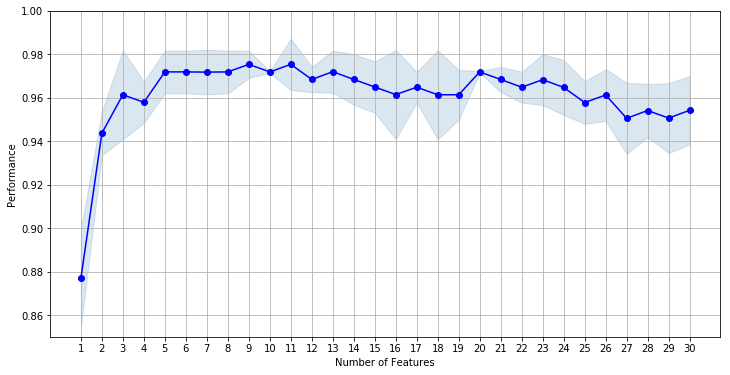

In [125]:
fig1 = plot_sfs(sfs_forward.get_metric_dict(), kind='std_dev')

plt.ylim([0.85, 1])
plt.grid()
fig1.set_size_inches(12, 6)
plt.show()

In [55]:
sfs_forward.get_metric_dict()

{1: {'feature_idx': (27,),
  'cv_scores': array([0.86111111, 0.875     , 0.85714286, 0.91428571]),
  'avg_score': 0.8768849206349206,
  'feature_names': ('concave_points_worst',),
  'ci_bound': 0.03620870513134662,
  'std_dev': 0.022588351142387997,
  'std_err': 0.013041390612607501},
 2: {'feature_idx': (13, 27),
  'cv_scores': array([0.95833333, 0.95833333, 0.94285714, 0.92857143]),
  'avg_score': 0.9470238095238095,
  'feature_names': ('area_se', 'concave_points_worst'),
  'ci_bound': 0.019854690898759898,
  'std_dev': 0.012386102408740966,
  'std_err': 0.0071511195598968685},
 3: {'feature_idx': (13, 21, 27),
  'cv_scores': array([0.95833333, 0.97222222, 0.95714286, 0.95714286]),
  'avg_score': 0.9612103174603175,
  'feature_names': ('area_se', 'texture_worst', 'concave_points_worst'),
  'ci_bound': 0.010221050386124662,
  'std_dev': 0.006376275382627522,
  'std_err': 0.003681344308587184},
 4: {'feature_idx': (1, 13, 21, 27),
  'cv_scores': array([0.95833333, 0.97222222, 0.9571428

In [127]:
# наилучшее качество по точности получилось на 11 фичах
best_feats = ['texture_mean',
   'smoothness_mean',
   'symmetry_mean',
   'fractal_dimension_mean',
   'radius_se',
   'texture_se',
   'compactness_se',
   'fractal_dimension_se',
   'radius_worst',
   'texture_worst',
   'concave_points_worst']

In [162]:
y = df[['target']]
X = df[best_feats]#.drop(labels=['target','id'], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

In [163]:
# random forest
clf = RandomForestClassifier(n_estimators=100, max_depth=30, random_state=0)
clf.fit(X_train, y_train)
y_train_predict = clf.predict(X_train)
y_test_predict = clf.predict(X_test)
get_metrics(model=logit, y_train=y_train, y_train_predict=y_train_predict, 
            y_test=y_test, y_test_predict=y_test_predict)

print('Get predict_proba : ')
print(clf.predict_proba(X_test))

Accuracy of the classifier on train set: 1.00000
Accuracy of the classifier on test set: 0.95789
Precision of the classifier on train set: 1.00000
Precision of the classifier on test set: 0.92157
Recall of the classifier on train set: 1.00000
Recall of the classifier on test set: 0.95918
F1_score of the classifier on train set: 1.00000
F1_score of the classifier on test set: 0.94000
Get predict_proba : 
[[0.95 0.05]
 [0.   1.  ]
 [0.03 0.97]
 [0.99 0.01]
 [0.98 0.02]
 [0.01 0.99]
 [0.   1.  ]
 [0.24 0.76]
 [0.25 0.75]
 [0.99 0.01]
 [0.89 0.11]
 [0.02 0.98]
 [0.79 0.21]
 [0.23 0.77]
 [0.99 0.01]
 [0.06 0.94]
 [0.96 0.04]
 [0.99 0.01]
 [0.99 0.01]
 [0.   1.  ]
 [0.69 0.31]
 [0.99 0.01]
 [0.   1.  ]
 [0.97 0.03]
 [0.96 0.04]
 [0.94 0.06]
 [1.   0.  ]
 [0.91 0.09]
 [0.99 0.01]
 [0.01 0.99]
 [0.96 0.04]
 [0.99 0.01]
 [0.74 0.26]
 [0.95 0.05]
 [1.   0.  ]
 [0.99 0.01]
 [0.42 0.58]
 [0.86 0.14]
 [0.   1.  ]
 [0.81 0.19]
 [0.99 0.01]
 [0.01 0.99]
 [1.   0.  ]
 [1.   0.  ]
 [0.59 0.41]
 [0.94 0

C:\Users\mi\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  This is separate from the ipykernel package so we can avoid doing imports until


In [164]:
# логистическая регрессия
logit = LogisticRegression()
logit.fit(X_train, y_train)

y_train_predict = logit.predict(X_train)
y_test_predic = logit.predict(X_test)

get_metrics(model=logit, y_train=y_train, y_train_predict=y_train_predict, 
            y_test=y_test, y_test_predict=y_test_predict)

print('Get predict_proba : ')
print(logit.predict_proba(X_test))

Accuracy of the classifier on train set: 0.92606
Accuracy of the classifier on test set: 0.95789
Precision of the classifier on train set: 0.96040
Precision of the classifier on test set: 0.92157
Recall of the classifier on train set: 0.85088
Recall of the classifier on test set: 0.95918
F1_score of the classifier on train set: 0.90233
F1_score of the classifier on test set: 0.94000
Get predict_proba : 
[[6.54970921e-01 3.45029079e-01]
 [3.40239965e-02 9.65976003e-01]
 [2.30417837e-01 7.69582163e-01]
 [9.19137071e-01 8.08629293e-02]
 [9.25108464e-01 7.48915359e-02]
 [2.37225119e-02 9.76277488e-01]
 [1.04461490e-02 9.89553851e-01]
 [2.03092586e-01 7.96907414e-01]
 [5.58942365e-01 4.41057635e-01]
 [7.31028764e-01 2.68971236e-01]
 [7.57103319e-01 2.42896681e-01]
 [1.85420760e-01 8.14579240e-01]
 [7.34394963e-01 2.65605037e-01]
 [6.31890046e-01 3.68109954e-01]
 [6.91524432e-01 3.08475568e-01]
 [6.27929168e-01 3.72070832e-01]
 [7.72751869e-01 2.27248131e-01]
 [9.83674864e-01 1.63251361e-02]

C:\Users\mi\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\mi\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


На приведенном датасете подход forward selection сработал лучше, что можно увидеть по увеличенному качеству